# MountainCar Introduction

In [1]:
import sys

# Colab setup
if 'google.colab' in sys.modules:
    %pip install -q -U gymnasium
    %pip install -q -U gymnasium[classic_control,box2d,atari,accept-rom-license]
    
from pathlib import Path
import numpy as np
import sklearn
import tensorflow as tf
from tensorflow import keras
import gymnasium as gym
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import seaborn as sns

# Make notebook output stable across runs
random_state = 1000
np.random.seed(random_state)
tf.random.set_seed(random_state)

# Plot settings
%matplotlib inline
sns.set()
mpl.rc('font', size=14)
mpl.rc('axes', labelsize=14, titlesize=14)
mpl.rc('legend', fontsize=14)
mpl.rc('xtick', labelsize=10)
mpl.rc('ytick', labelsize=10)
mpl.rc('animation', html='jshtml')

In [2]:
# Utility functions

def print_car(obs, reward):
    print(f'Last reward:  {reward: .3f}')
    print((f'Car position: {obs[0]: .3f}\n'
           f'Car velocity: {obs[1]: .3f}'))

def plot_environment(env, figsize=(5, 4)):
    plt.figure(figsize=figsize)
    img = env.render()
    plt.imshow(img)
    plt.axis("off")
    return img


def update_scene(num, frames, patch):
    patch.set_data(frames[num])
    return patch


def plot_animation(frames, repeat=False, interval=100):
    fig = plt.figure()
    patch = plt.imshow(frames[0])
    plt.axis('off')
    anim = animation.FuncAnimation(fig, update_scene, fargs=(frames, patch),
                                   frames=len(frames), repeat=repeat, 
                                   interval=interval)
    plt.close()
    return anim    

## MountainCar: Step by Step

At each step, we observe the state of the system:

- The car's horizontal position
- The car's velocity

In [3]:
env = gym.make('MountainCar-v0', render_mode='rgb_array')
obs, info = env.reset(seed=random_state)
obs

array([-0.49572286,  0.        ], dtype=float32)

In [4]:
print_car(obs, 0)

Last reward:   0.000
Car position: -0.496
Car velocity:  0.000


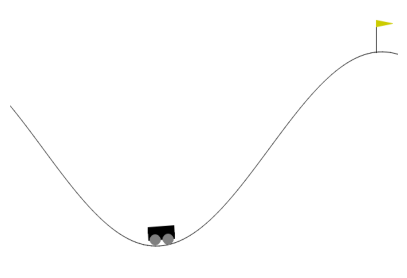

In [5]:
# Visualize the cart
plot_environment(env)
plt.show()

In [6]:
# There are two possible actions
# Action 0 is "accelerate to the left"
# Action 1 is "do nothing"
# Action 2 is "accelerate to the right"
env.action_space

Discrete(3)

Take an action, and view the:

- State
- Reward
- Whether the environment has terminated (done or truncated)
- Debugging information

In [7]:
def simple_policy(obs):
    position = obs[0]
    velocity = obs[1]
    
    if position < -0.5:
        if velocity > 0:
            return 0 # push left
        else:
            return 2 # push right
    else:
        if velocity > .1:
            return 2 # push right
        else:
            return 0

In [8]:
# Run 1,000 episodes to see how the policy performs
num_episodes = 100
max_steps_per_episode = 500

episode_rewards = []
for episode in range(num_episodes):
    obs, info = env.reset()
    
    cumulative_reward = 0
    for step in range(max_steps_per_episode):
        action = simple_policy(obs)
        obs, reward, done, truncated, info = env.step(action)
        cumulative_reward += reward
        if done:
            break
    
    episode_rewards.append(cumulative_reward)

In [9]:
# Calculate the mean and standard deviation of the per-episode rewards
print(f'Reward mean:   {np.mean(episode_rewards):.3f}')
print(f'Reward stdev:  {np.std(episode_rewards):.3f}')

# Calculate the min and max of the per-episode rewards
print(f'Reward min:    {np.min(episode_rewards):.3f}')
print(f'Reward max:    {np.max(episode_rewards):.3f}')


Reward mean:   -500.000
Reward stdev:  0.000
Reward min:    -500.000
Reward max:    -500.000


In [10]:
# Visualize a single episode
frames = []
obs, info = env.reset(seed=random_state)
for step in range(max_steps_per_episode):
    img = env.render()
    frames.append(img)
    action = simple_policy(obs)

    obs, reward, done, truncated, info = env.step(action)
    if done:
        break

plot_animation(frames)